# Introduction:
# Overview of association rules, recommender systems, and topic modeling
# Importance of each technique in understanding customer behavior and preferences

## Import necessary libraries

In [20]:
import nltk
import gensim
import numpy as np
import pandas as pd
import seaborn as sns
from math import sqrt
import networkx as nx
from dateutil import parser
import plotly.express as px
import pyLDAvis.gensim_models
from textblob import TextBlob
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk.corpus import stopwords
from sklearn.cluster import KMeans
from scipy.sparse import csr_matrix
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel
from gensim.utils import simple_preprocess
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import NearestNeighbors
from nltk.stem.wordnet import WordNetLemmatizer
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.decomposition import LatentDirichletAllocation, NMF
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [21]:
sns.set()

# Dataset Description

Description of the customer reviews dataset.
Initial exploratory data analysis.

In [2]:
# Load and describe the dataset
df = pd.read_csv('./data/customer_reviews.csv')
print(df.info())
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34660 entries, 0 to 34659
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    34660 non-null  object 
 1   name                  27900 non-null  object 
 2   asins                 34658 non-null  object 
 3   brand                 34660 non-null  object 
 4   categories            34660 non-null  object 
 5   keys                  34660 non-null  object 
 6   manufacturer          34660 non-null  object 
 7   reviews.date          34621 non-null  object 
 8   reviews.dateAdded     24039 non-null  object 
 9   reviews.dateSeen      34660 non-null  object 
 10  reviews.didPurchase   1 non-null      object 
 11  reviews.doRecommend   34066 non-null  object 
 12  reviews.id            1 non-null      float64
 13  reviews.numHelpful    34131 non-null  float64
 14  reviews.rating        34627 non-null  float64
 15  reviews.sourceURLs 

C:\Users\Amram\AppData\Local\Temp\ipykernel_42100\424756645.py:2: DtypeWarning: Columns (1,10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('./data/customer_reviews.csv')


reviews.rating
5.0    23775
4.0     8541
3.0     1499
1.0      410
2.0      402
Name: count, dtype: int64


C:\Python\Python3_11_7\Lib\site-packages\IPython\core\pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
C:\Python\Python3_11_7\Lib\site-packages\IPython\core\pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
C:\Python\Python3_11_7\Lib\site-packages\IPython\core\pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


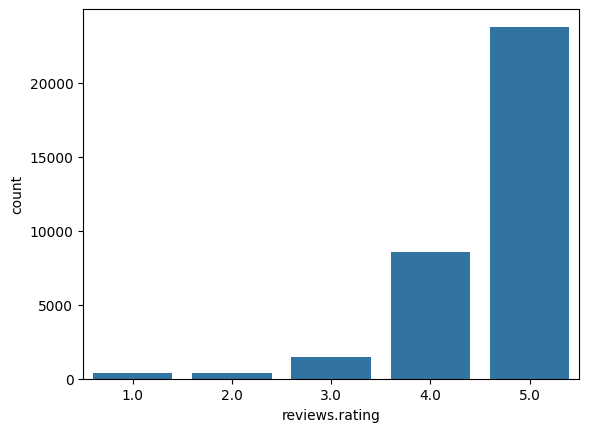

In [3]:
# Initial exploratory data analysis
print(df['reviews.rating'].value_counts())
sns.countplot(x='reviews.rating', data=df)
plt.show()

# Data Preprocessing

Steps to clean and prepare the data for analysis.
Text preprocessing (e.g., tokenization, stop words removal) for topic modeling.

In [4]:
# Step 3: Data Preprocessing
# Clean and prepare the data for analysis
df['reviews.text'] = df['reviews.text'].astype(str).str.lower().str.replace('[^\w\s]', '')

# Text preprocessing for topic modeling
stop_words = stopwords.words('english')

vectorizer = CountVectorizer(stop_words=stop_words, max_features=1000)
text_matrix = vectorizer.fit_transform(df['reviews.text'])

<>:3: DeprecationWarning: invalid escape sequence '\w'
<>:3: DeprecationWarning: invalid escape sequence '\w'
C:\Users\Amram\AppData\Local\Temp\ipykernel_42100\505445794.py:3: DeprecationWarning: invalid escape sequence '\w'
  df['reviews.text'] = df['reviews.text'].astype(str).str.lower().str.replace('[^\w\s]', '')


# Topic Modeling

Implementing topic modeling using techniques like Latent Dirichlet Allocation (LDA) or Non-Negative Matrix Factorization (NMF).
Extracting and interpreting topics from customer reviews.
Visualizing topics and their distribution across reviews.

In [5]:
# Step 4: Topic Modeling
# Implementing topic modeling using LDA
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda_topics = lda.fit_transform(text_matrix)

# Extracting and interpreting topics
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx}:")
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

display_topics(lda, vectorizer.get_feature_names_out(), 10)

Topic 0:
echo music alexa great use love home amazon fun sound
Topic 1:
great bought tablet loves love one price old gift use
Topic 2:
kindle read reading books love easy one light screen great
Topic 3:
tablet good great price apps use amazon games like play
Topic 4:
tv fire amazon great prime easy use cable stick streaming


In [6]:
# Extracting the topic-term distribution
topics = lda.components_

# Getting the top words for each topic
top_n = 10
top_words = []
for topic in topics:
    top_word_indices = topic.argsort()[-top_n:][::-1]
    top_words.append([vectorizer.get_feature_names_out()[i] for i in top_word_indices])
    
# Displaying the top words for each topic
for i, topic_words in enumerate(top_words):
    print(f"Topic {i+1}: {', '.join(topic_words)}")

Topic 1: echo, music, alexa, great, use, love, home, amazon, fun, sound
Topic 2: great, bought, tablet, loves, love, one, price, old, gift, use
Topic 3: kindle, read, reading, books, love, easy, one, light, screen, great
Topic 4: tablet, good, great, price, apps, use, amazon, games, like, play
Topic 5: tv, fire, amazon, great, prime, easy, use, cable, stick, streaming


In [7]:
# Calculate document-topic distribution
doc_topic_dist = lda.transform(text_matrix)

# Displaying the document-topic distribution for the first few documents
print(doc_topic_dist[:5])

[[0.01592765 0.21561766 0.01581855 0.0157694  0.73686673]
 [0.02869981 0.88528906 0.02865601 0.02871057 0.02864455]
 [0.02600606 0.89778997 0.02525484 0.02564472 0.02530442]
 [0.00462156 0.00464638 0.33967013 0.31784645 0.33321548]
 [0.00476224 0.35612692 0.00471717 0.62956043 0.00483323]]


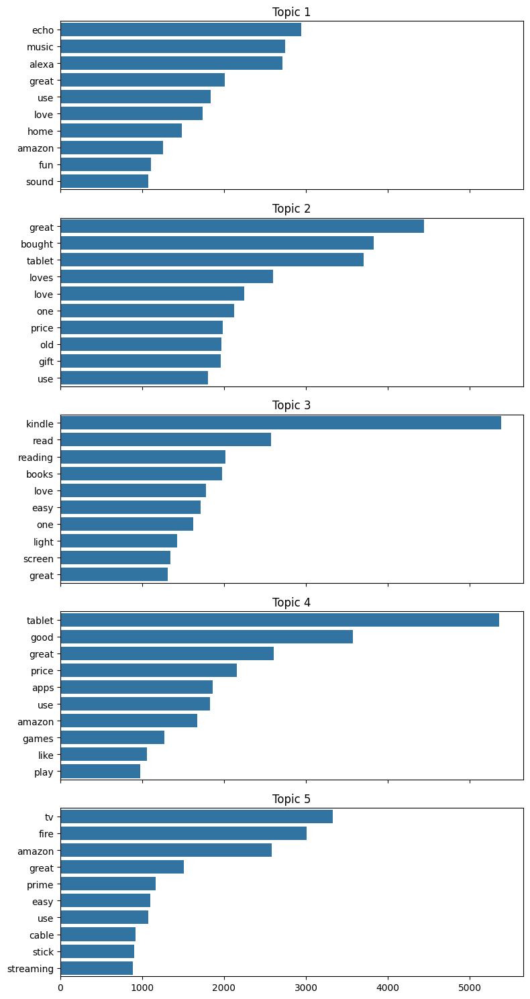

In [8]:
# Plotting the top words for each topic
fig, axes = plt.subplots(lda.n_components, 1, figsize=(8, 15), sharex=True)

for i, (ax, topic) in enumerate(zip(axes, topics)):
    top_word_indices = topic.argsort()[-top_n:][::-1]
    top_word_probs = topic[top_word_indices]
    top_word_labels = [vectorizer.get_feature_names_out()[i] for i in top_word_indices]
    sns.barplot(x=top_word_probs, y=top_word_labels, ax=ax)
    ax.set_title(f'Topic {i+1}')
    
plt.tight_layout()
plt.show()

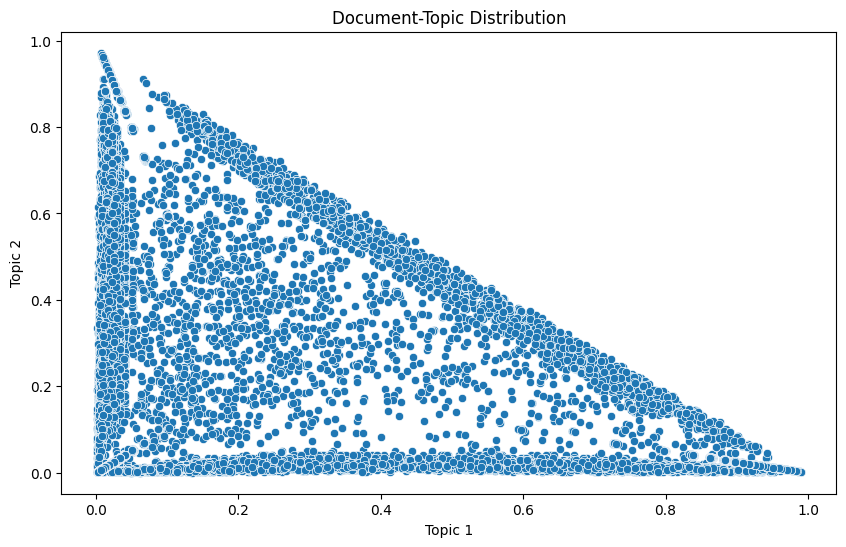

In [9]:
# Visualizing document-topic distribution
doc_topic_df = pd.DataFrame(doc_topic_dist, columns=[f'Topic {i+1}' for i in range(lda.n_components)])

# Scatter plot of the first two topics
plt.figure(figsize=(10, 6))
sns.scatterplot(data=doc_topic_df, x='Topic 1', y='Topic 2')
plt.title('Document-Topic Distribution')
plt.xlabel('Topic 1')
plt.ylabel('Topic 2')
plt.show()

In [10]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Amram\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [11]:
# Preprocess the documents
def preprocess(doc):
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    tokens = simple_preprocess(doc)
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words]
    return tokens

processed_docs = [preprocess(doc) for doc in list(df['reviews.text'].values)]
dictionary = Dictionary(processed_docs)
corpus = [dictionary.doc2bow(doc) for doc in processed_docs]

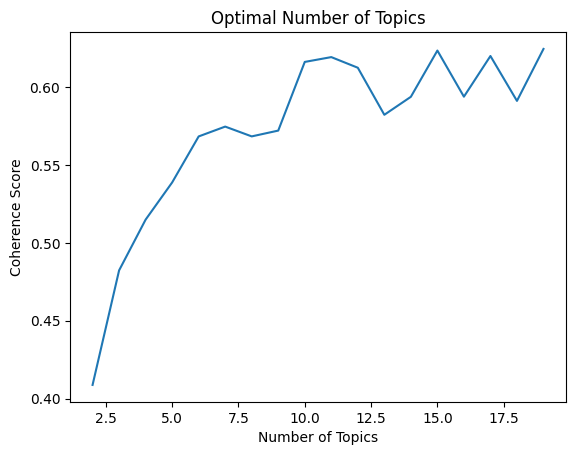

In [12]:
# Function to extract topics from LDA model
def get_lda_topics(model, vectorizer, top_n=10):
    words = vectorizer.get_feature_names_out()
    topics = []
    for topic_weights in model.components_:
        top_words = [words[i] for i in topic_weights.argsort()[:-top_n-1:-1]]
        topics.append(top_words)
    return topics

coherence_scores = []
topic_range = range(2, 20)

for num_topics in topic_range:
    lda_model = LatentDirichletAllocation(n_components=num_topics, random_state=42)
    lda_model.fit(text_matrix)
    topics = get_lda_topics(lda_model, vectorizer)
    coherence_model_lda = CoherenceModel(topics=topics, texts=processed_docs, dictionary=dictionary, coherence='c_v')
    coherence_scores.append(coherence_model_lda.get_coherence())

# Plotting the coherence scores
plt.plot(topic_range, coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Optimal Number of Topics')
plt.show()

In [13]:
# Assuming you have already trained your LDA model
lda_model = LatentDirichletAllocation(n_components=10, random_state=42)
lda_model.fit(text_matrix)

# Extracting topics from the LDA model
def get_lda_topics(model, vectorizer, top_n=10):
    words = vectorizer.get_feature_names_out()
    topics = []
    for topic_weights in model.components_:
        top_words = [words[i] for i in topic_weights.argsort()[:-top_n-1:-1]]
        topics.append(top_words)
    return topics

topics = get_lda_topics(lda_model, vectorizer)

In [14]:
# Use the extracted topics to compute coherence score
coherence_model_lda = CoherenceModel(topics=topics, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.6162411051985323


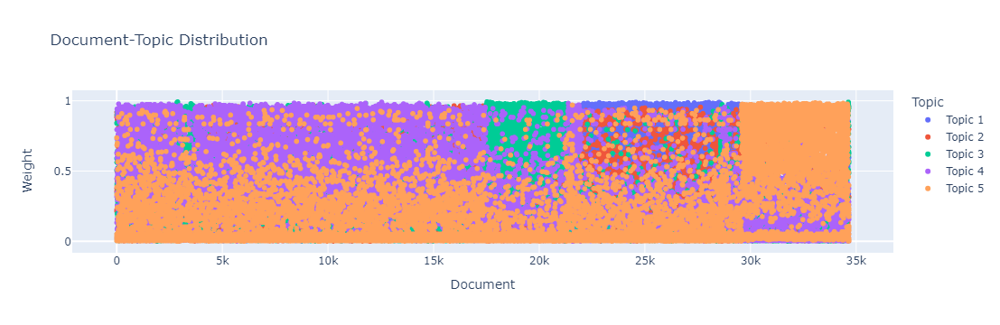

In [15]:
# Prepare data for Plotly
doc_topic_df['Document'] = doc_topic_df.index
melted_df = doc_topic_df.melt(id_vars=['Document'], var_name='Topic', value_name='Weight')

# Interactive scatter plot
fig = px.scatter(melted_df, x='Document', y='Weight', color='Topic', title='Document-Topic Distribution')
fig.show()

C:\Users\Amram\AppData\Local\Temp\ipykernel_42100\1321526644.py:7: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



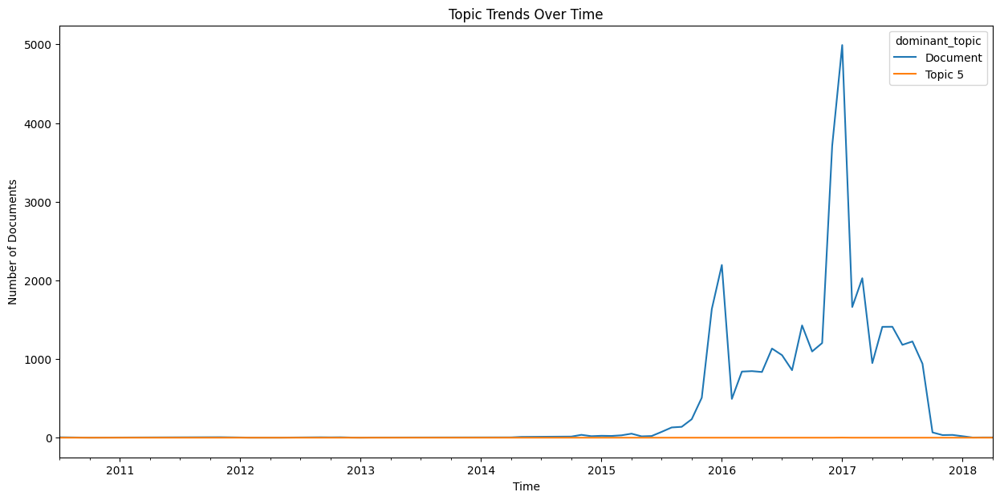

In [16]:
# Assuming 'date' is a column in your original dataframe
df['dominant_topic'] = doc_topic_df.idxmax(axis=1)
df['reviews.date'] = df['reviews.date'].astype(str).apply(lambda x: parser.parse(x) if x != 'nan' else pd.NaT)
df['date'] = pd.to_datetime(df['reviews.date'])

# Plot topic trends over time
topic_trends = df.groupby([df['date'].dt.to_period('M'), 'dominant_topic']).size().unstack().fillna(0)

topic_trends.plot(kind='line', figsize=(15, 7), title='Topic Trends Over Time')
plt.xlabel('Time')
plt.ylabel('Number of Documents')
plt.show()

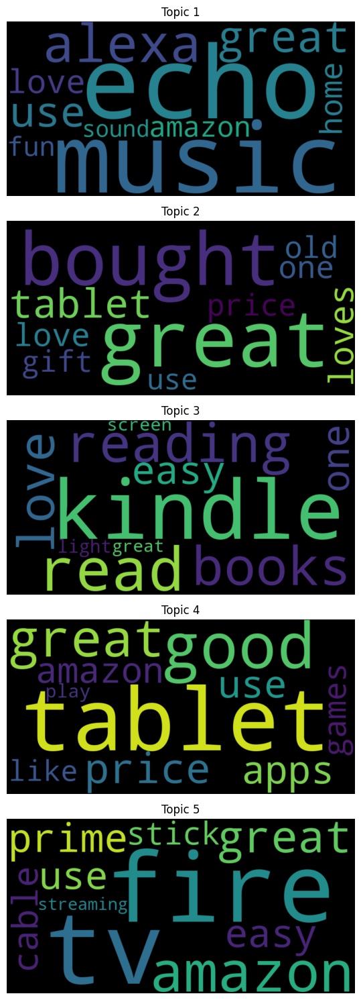

In [17]:
# Assuming lda is your LDA model and vectorizer is your fitted vectorizer
# Extract the topics from the LDA model
topics = lda.components_

fig, axes = plt.subplots(len(topics), 1, figsize=(10, 15), sharex=True)
top_n = 10  # Specify the number of top words you want to display

for i, (ax, topic) in enumerate(zip(axes, topics)):
    top_word_indices = topic.argsort()[-top_n:][::-1]
    top_word_labels = {vectorizer.get_feature_names_out()[j]: topic[j] for j in top_word_indices}
    wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(top_word_labels)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Topic {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

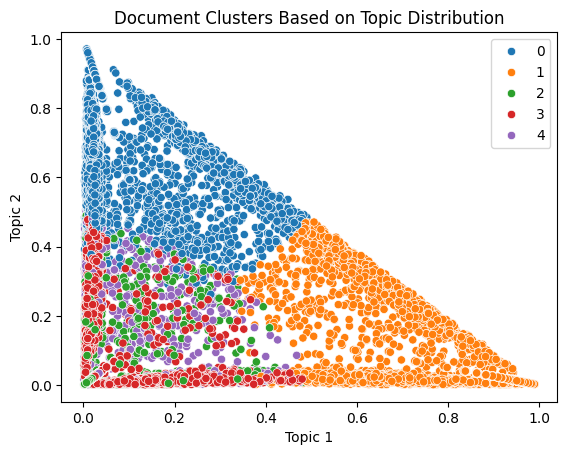

In [18]:
# Clustering documents based on topic distribution
num_clusters = lda.n_components
km = KMeans(n_clusters=num_clusters, random_state=42)
km.fit(doc_topic_dist)
clusters = km.labels_

# Add cluster information to the original dataframe
df['Cluster'] = clusters

# Visualize the clusters
sns.scatterplot(data=doc_topic_df, x='Topic 1', y='Topic 2', hue=clusters, palette='tab10')
plt.title('Document Clusters Based on Topic Distribution')
plt.show()

# Association Rules

Implementing Apriori or FP-Growth algorithm.
Extracting and interpreting association rules.
Visualizing frequent itemsets and rules.

In [22]:
def update_frequent_itemsets(data_chunk, min_support, existing_frequent_itemsets=None):
    # Prepare data for association rules
    basket = (data_chunk.groupby(['id', 'reviews.text'])['reviews.rating']
              .sum().unstack().reset_index().fillna(0)
              .set_index('id'))

    # Convert values to 1 and 0
    basket_sets = basket.applymap(lambda x: 1 if x > 0 else 0)

    # Convert DataFrame to sparse matrix
    sparse_basket_sets = csr_matrix(basket_sets.values)

    # Convert sparse matrix back to DataFrame
    basket_sets_sparse = pd.DataFrame.sparse.from_spmatrix(sparse_basket_sets, index=basket_sets.index, columns=basket_sets.columns)

    # Generate frequent itemsets
    new_frequent_itemsets = apriori(basket_sets_sparse, min_support=min_support, use_colnames=True)

    # Combine with existing frequent itemsets
    if existing_frequent_itemsets is not None:
        combined_frequent_itemsets = pd.concat([existing_frequent_itemsets, new_frequent_itemsets])
        combined_frequent_itemsets = combined_frequent_itemsets.groupby('itemsets').agg({
            'support': 'sum'
        }).reset_index()
        return combined_frequent_itemsets
    else:
        return new_frequent_itemsets

# Define function to process data in chunks
def process_data_in_chunks(df, chunk_size, min_support):
    n_chunks = len(df) // chunk_size + 1
    frequent_itemsets = None
    for i in range(n_chunks):
        chunk = df.iloc[i*chunk_size : (i+1)*chunk_size]
        frequent_itemsets = update_frequent_itemsets(chunk, min_support, frequent_itemsets)
    return frequent_itemsets

In [25]:
# Define parameters
chunk_size = 1000  # Adjust this based on your memory constraints
min_support = 0.01

# Process data in chunks
frequent_itemsets = process_data_in_chunks(df[['id', 'reviews.text', 'reviews.rating']], chunk_size, min_support)

# Extracting Association Rules
min_confidence = 0.5
min_lift = 1

# Generate association rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=min_lift)
rules = rules[(rules['confidence'] >= min_confidence)]

# Further Filtering and Sorting of Rules
rules = rules.sort_values(by=['lift', 'confidence'], ascending=False)

# Visualization of Frequent Itemsets and Rules
plt.figure(figsize=(10, 6))
sns.scatterplot(x="support", y="confidence", size="lift", data=rules, legend=False)
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.title('Support vs Confidence with Lift as Size')
plt.grid(True)
plt.show()

C:\Users\Amram\AppData\Local\Temp\ipykernel_42100\522414925.py:8: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.

C:\Python\Python3_11_7\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:109: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



MemoryError: cannot allocate array memory

In [ ]:
# Network graph visualization
# Prepare edge data for network graph
rules['antecedents'] = rules['antecedents'].apply(lambda x: list(x)[0])
rules['consequents'] = rules['consequents'].apply(lambda x: list(x)[0])
G = nx.from_pandas_edgelist(rules, source='antecedents', target='consequents', edge_attr='lift')

# Draw network graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, k=0.5)
nx.draw(G, pos, with_labels=True, node_size=3000, font_size=10, font_weight='bold')
edge_labels = nx.get_edge_attributes(G, 'lift')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.title('Association Rules Network Graph')
plt.show()

In [ ]:
# Analysis of Results
# Display top 10 rules for detailed analysis
top_rules = rules.head(10)
print("Top 10 Association Rules:")
print(top_rules)

# Advanced Filtering (Optional)
# Add leverage and conviction for more detailed filtering
rules['leverage'] = (rules['support'] - rules['antecedent support']*rules['consequent support'])
rules['conviction'] = (1 - rules['consequent support']) / (1 - rules['confidence'])

# Further filter rules based on leverage and conviction
rules = rules[(rules['leverage'] > 0) & (rules['conviction'] > 1)]

# Display rules after advanced filtering
filtered_rules = rules.head(10)
print("Filtered Association Rules based on Leverage and Conviction:")
print(filtered_rules)

In [ ]:
# Parameter Tuning (Optional)
# Smaller ranges for parameter tuning
min_support_range = [0.01, 0.015, 0.02]
min_confidence_range = [0.5, 0.55, 0.6]

# Store results for different parameter combinations
results = []

for support in min_support_range:
    for confidence in min_confidence_range:
        frequent_itemsets = apriori(basket_sets, min_support=support, use_colnames=True)
        rules = association_rules(frequent_itemsets, metric="lift", min_threshold=min_lift)
        rules = rules[(rules['confidence'] >= confidence)]
        results.append((support, confidence, len(rules)))

# Display results of parameter tuning
print("Parameter Tuning Results (Support, Confidence, Number of Rules):")
for result in results:
    print(result)

# Recommender Systems

Implementing collaborative filtering (user-based and item-based) and content-based filtering.
Incorporating insights from topic modeling to enhance content-based recommendations.
Evaluating the performance of different recommender algorithms.
Visualizing recommendations.

In [ ]:
# Extract necessary columns for recommendation
df_recommend = df[['id', 'reviews.username', 'reviews.rating', 'reviews.text']]

# Collaborative Filtering
# Create a pivot table for user-item interaction matrix
df_pivot = df_recommend.pivot(index='reviews.username', columns='id', values='reviews.rating').fillna(0)

# User-User Collaborative Filtering
user_sim = cosine_similarity(df_pivot)
user_sim_df = pd.DataFrame(user_sim, index=df_pivot.index, columns=df_pivot.index)

def get_user_recommendations(user, num_recommendations=5):
    similar_scores = user_sim_df[user].sort_values(ascending=False).drop(user)
    recommendations = []
    for other_user in similar_scores.index:
        user_rated_items = df_pivot.loc[other_user][df_pivot.loc[other_user] > 0].index.tolist()
        recommendations.extend(user_rated_items)
        if len(recommendations) >= num_recommendations:
            break
    return recommendations[:num_recommendations]


# Example usage
print("User-User Collaborative Filtering Recommendations:")
print(get_user_recommendations('user1', 5))  # Replace 'user1' with an actual username from your dataset

In [ ]:
# Item-Item Collaborative Filtering
item_sim = cosine_similarity(df_pivot.T)
item_sim_df = pd.DataFrame(item_sim, index=df_pivot.columns, columns=df_pivot.columns)

def get_item_recommendations(item_id, num_recommendations=5):
    similar_scores = item_sim_df[item_id].sort_values(ascending=False).drop(item_id)
    return similar_scores.index[:num_recommendations].tolist()

# Example usage
print("Item-Item Collaborative Filtering Recommendations:")
print(get_item_recommendations(0, 5))  # Replace 0 with an actual product id from your dataset

In [ ]:
# Model-Based Collaborative Filtering
# Convert pivot table to sparse matrix
df_sparse = csr_matrix(df_pivot.values)

# Fit KNN model
knn = NearestNeighbors(metric='cosine', algorithm='brute', n_neighbors=20)
knn.fit(df_sparse)

def get_knn_recommendations(user, num_recommendations=5):
    user_index = df_pivot.index.get_loc(user)
    distances, indices = knn.kneighbors(df_sparse[user_index], n_neighbors=num_recommendations+1)
    recommendations = []
    for i in range(1, len(distances.flatten())):
        idx = indices.flatten()[i]
        recommendations.extend(df_pivot.iloc[idx].sort_values(ascending=False).index.tolist())
    return recommendations[:num_recommendations]

# Example usage
print("Model-Based Collaborative Filtering (KNN) Recommendations:")
print(get_knn_recommendations('user1', 5))  # Replace 'user1' with an actual username from your dataset

In [ ]:
# Content-Based Filtering
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(df['reviews.text'])
cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)

def get_content_recommendations(product_id, num_recommendations=5):
    sim_scores = list(enumerate(cosine_sim[product_id]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:num_recommendations + 1]
    recommendations = [i[0] for i in sim_scores]
    return df['id'].iloc[recommendations].tolist()

# Example usage
print("Content-Based Filtering Recommendations:")
print(get_content_recommendations(0, 5))  # Replace 0 with an actual product id from your dataset

In [ ]:
# Hybrid Recommendations
def get_hybrid_recommendations(user, num_recommendations=5):
    user_recs = get_user_recommendations(user, num_recommendations)
    item_recs = []
    for item in user_recs:
        item_recs.extend(get_item_recommendations(item, num_recommendations))
    item_recs = list(set(item_recs))  # Remove duplicates
    return item_recs[:num_recommendations]

# Example usage
print("Hybrid Recommendations:")
print(get_hybrid_recommendations('user1', 5))  # Replace 'user1' with an actual username from your dataset

In [ ]:
# Evaluation Metrics
# Split data into training and test sets
train_data, test_data = train_test_split(df_recommend, test_size=0.2, random_state=42)

# Create pivot tables for training and test sets
train_pivot = train_data.pivot(index='reviews.username', columns='id', values='reviews.rating').fillna(0)
test_pivot = test_data.pivot(index='reviews.username', columns='id', values='reviews.rating').fillna(0)

def precision_at_k(user, k):
    relevant_items = set(test_pivot.loc[user][test_pivot.loc[user] > 0].index)
    recommended_items = set(get_user_recommendations(user, k))
    return len(relevant_items & recommended_items) / k

def mean_average_precision_at_k(k):
    users = test_pivot.index
    precisions = [precision_at_k(user, k) for user in users if user in user_sim_df.index]
    return np.mean(precisions)

# Example usage of evaluation metrics
print("Mean Average Precision at K=5:")
print(mean_average_precision_at_k(5))

# Comparison and Insights

Comparing the results and performance of association rules, topic modeling, and recommender systems.
Discussing how topic modeling insights can enhance the understanding of customer preferences and improve recommendation quality.
Highlighting use cases, advantages, and limitations of each technique.

In [ ]:
# Step 7: Comparison and Insights
# Comparing the results and performance of association rules, topic modeling, and recommender systems

# Discussing how topic modeling insights can enhance the understanding of customer preferences and improve recommendation quality

# Highlighting use cases, advantages, and limitations of each technique

# Conclusion

Summary of findings and the interplay between different techniques.
Potential improvements or future work.

In [ ]:
# Step 8: Conclusion
# Summary of findings and the interplay between different techniques
# Potential improvements or future work